# Capstone Project: Skin Lesion Classification and Diagnosis
## Notebook 1: Exploratory Data Analysis

### Table of Contents
- [Problem Statement](#Problem-Statement)
- [Executive Summary](#Executive-Summary)
- [Background Information](#Background-Information)
- [Importing Libraries](#Importing-Libraries)
- [Importing and Cleaning Data](#Importing-and-Cleaning-Data)
- [Creating Variables for Exploratory Data Analysis (EDA)](#Creating-Variables-for-Exploratory-Data-Analysis-(EDA))
- [Creating Target Variables for Diagnosis Classification](#Creating-Target-Variables-for-Diagnosis-Classification)
- [Exploratory Data Analysis](#Exploratory-Data-Analysis)
- [Summary Statistics](#Summary-Statistics)
- [EDA of Image Sizes](#EDA-of-Image-Sizes)
- [Analysing Images for Preprocessing Ideas](#Analysing-Images-for-Preprocessing-Ideas)
- [Preprocessing Ideas](#Preprocessing-Ideas)


### Problem Statement

Skin cancer is the most common cancer globally, with melanoma being the most deadly form. Even though dermoscopy, a skin imaging modality, has demonstrated improvement for the diagnosis of skin cancer compared to unaided visual inspection<sup>[[1]](https://challenge2019.isic-archive.com/)</sup>, numerous cases of benign lesions are still being diagnosed as malicious and vice versa<sup>[[2]](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6394090/)</sup>. Every year, poor diagnostic errors adds an estimated $673 million in overall cost to manage the disease<sup>[[3]](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5543387/)</sup>.

In this project, we aim to improve the diagnosis rate of skin cancer through the classification of skin lesions for dermatologists working at hospitals or skin clinics in Singapore, who will need experience or expertise in diagnosing skin cancer before they can accurately identify and diagnose lesions upon visual and dermoscopy inspection<sup>[[3]](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5543387/)</sup>. This will be done through the classification of skin lesion dermoscopy images, in which we will predict two important tasks through the usage of Convolutional Neural Network models: <br>
1. a specific skin lesion diagnosis, and <br>
2. whether the lesion is malignant, benign, or pre-cancerous. <br>

The model will be evaluated based on its accuracy, followed by its recall rate since we are looking to minimise false negatives. Ultimately, we aim to get as close to a real evaluation of a dermatologist as possible: predicting the type of skin lesion; and whether the lesion is malignant, pre-cancerous or benign from dermoscopy images. With our models, we hope to aid dermatologists in their decision-making process of diagnosing skin lesions, hence allowing them to improve their diagnostic accuracy and come up with appropriate treatments for patients with skin lesions and/or cancers.

### Executive Summary
Skin cancer is the most common cancer globally, with melanoma being the most deadly form. Even though dermoscopy, a skin imaging modality, has demonstrated improvement for the diagnosis of skin cancer compared to unaided visual inspection, many benign lesions are still being misdiagnosed as malicious and vice versa. Every year, these misdiagnosis errors adds an estimated $673 million in overall cost to manage the disease. 

In this project, we aim to improve the diagnosis rate of skin cancer for dermatologists working at various hospitals and skin clinics in Singapore, who typically require a lot of experience before they can accurately identify and diagnose skin cancer upon visual inspection and dermoscopy. Through the usage of Convolutional Neural Network models, we will execute two important image classification tasks:
1. Classifying dermoscopic images based on their specific skin lesion, followed by
2. Classifying dermoscopic images based on their appropriate diagnosis (malignant, benign, or pre-cancerous)

To train our model, our data was collected from 6 data sources; subsets of images from 3 main data sources (ISIC 2018, 2019 and 2020 datasets) collected and combined to form our initial dermoscopy image dataset, before adding images from 3 external data sources (DermNetNZ, Dermscopedia and 7-Point Criteria Evaluation datasets) to tackle the problem of imbalanced classes and increase the number of images for the minority classes. In total, our final image dataset contains 10276 images from these 6 data sources. 

Resizing, central cropping, padding, and colour normalisation (gray-world algorithm) were techniques used during image preprocessing to standardise the images in terms of their colours and sizes. Morphological filtering and inpainting methods were also utilised to remove black hairs and markings present in numerous images.

For modelling and evaluation, our CNN models from both classification tasks will be mainly evaluated based on two main metrics, first on their accuracy rate, followed by their recall rate since we are looking to minimise false negatives. With a moderately high accuracy of 70.53% for our skin lesion classification task and 76.36% for our diagnosis classification task, the overall performance of our CNN models for both classification tasks are moderately successful. In terms of their recall rates, both models have surpassed their baseline score for their respective tasks, with weighted averaged recall rates all exceeding 70% (70.53% for skin lesion; 76.36% for diagnosis) and macro-averaged recall rates all surpassing 60% (60.68% for skin lesion; 64.43% for diagnosis). With both accuracy and recall rates being lower for most of the minority classes, adding more image data for the minority classes should be of utmost priority when training the model in the future. 

### Background Information
In this project, we will be classifying dermoscopic images into their respective seven classes (for the first classification task) and their respective diagnosis (for the second classification task). Each skin lesion's abbreviation, diagnosis, general description, and shape and colour characteristics<sup>[[4]](https://arxiv.org/pdf/1803.10417.pdf)</sup> will be stated below:

|<div style="width:70px">Skin Lesion</div>|<div style="width:70px">Abbreviation</div>|Diagnosis|<div style="width:120px">Description</div>|<div style="width:380px">Shape and Colour Chacteristics</div>|
|:---|:---|:---|:---|:------|
|**Actinic Keratoses**|AKIEC|Pre-cancerous|Includes Solar Keratoses and Bowen’s disease, which may progress to the  squamous cell carcinoma|Neoplasms commonly show surface scaling and commonly are devoid of pigment, though pigmented variants are still included in this set
|**Basal Cell Carcinoma**|BCC|Malignant|Common variant of epithelial skin cancer that rarely metastasizes but grows destructively if untreated.|Appears in different morphologic variants (flat, nodular, pigmented, cystic)|
|**Benign Keratosis-like Lesions**|BKL|Benign|Generic class that includes seborrheic keratoses/SK (senile wart), solar lentigo/SL (a flat variant of SK) and lichen-planus like keratoses/LPLK (SK or SL with inflammation and regression)|All three subgroups look different dermatoscopically; LPLK can show morphologic features mimicking MEL|
|**Dermatofibroma**|DF|Benign|A benign skin lesion regarded as either a benign proliferation or an inflammatory reaction to minimal trauma|Reticular lines at the periphery with a central white patch denoting fibrosis|
|**Melanoma**|MEL|Malignant|Malignant neoplasm derived from melanocytes; can be invasive or noninvasive|May appear in different variants and are usually, but not always, chaotic; dataset included all variants, except non-pigmented, subungual, ocular or mucosal melanoma
|**Melanocytic Nevi**|NV|Benign|Benign neoplasms of melanocytes|Appear in a myriad of variants, which are all included in this set; Usually more symmetric with regard to the distribution of color and structure|
|**Vascular Lesions**|VASC|Benign|Range from cherry angiomas and angiokeratomas to pyogenic granulomas and hemorrhage|Characterized by red or purple color and solid, well circumscribed structures known as red clods or lacunes|


### Importing Libraries

In [9]:
#!pip install tqdm
#!pip install imageio
#!pip install cv2

In [10]:
#import libraries
import os
import cv2
import keras
import imageio
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import array_to_img, img_to_array
import tensorflow as tf
from tqdm import tqdm_notebook

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

### Importing and Cleaning Data

In [11]:
#read in ground_truth data which contains labels
all_labels = pd.read_csv('./datasets/ground_truth.csv')

In [12]:
#check for number of rows and columns for train
all_labels.shape

(10276, 8)

In [13]:
#display columns
all_labels.columns

Index(['image', 'MEL', 'NV', 'BCC', 'AKIEC', 'BKL', 'DF', 'VASC'], dtype='object')

In [14]:
#turn all columns into lowercase
all_labels.columns = all_labels.columns.str.lower()
all_labels.columns

Index(['image', 'mel', 'nv', 'bcc', 'akiec', 'bkl', 'df', 'vasc'], dtype='object')

In [15]:
#check for null values
#no null values present
all_labels.isnull().sum()

image    0
mel      0
nv       0
bcc      0
akiec    0
bkl      0
df       0
vasc     0
dtype: int64

In [16]:
#no duplicates for images
all_labels['image'].duplicated().any()

False

In [17]:
#checking data types
#all 7 labels are in the form of integers
all_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10276 entries, 0 to 10275
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   10276 non-null  object
 1   mel     10276 non-null  int64 
 2   nv      10276 non-null  int64 
 3   bcc     10276 non-null  int64 
 4   akiec   10276 non-null  int64 
 5   bkl     10276 non-null  int64 
 6   df      10276 non-null  int64 
 7   vasc    10276 non-null  int64 
dtypes: int64(7), object(1)
memory usage: 642.4+ KB


### Creating Variables for Exploratory Data Analysis (EDA)

#### Skin Lesion Classification

In [18]:
#create lesion variable that states the respective skin lesion
lesions = pd.DataFrame([x for x in np.where(all_labels == 1, 
                                            all_labels.columns,'').flatten().tolist() if len(x) > 0], 
                       columns=['lesion'] )
lesions.head()

,lesion
0,df
1,df
2,df
3,df
4,df


In [19]:
#merge lesions with all_labels to form all_labels
all_labels = pd.concat([all_labels, lesions], axis=1)
all_labels.head()

,image,mel,nv,bcc,akiec,bkl,df,vasc,lesion
0,DERM_001,0,0,0,0,0,1,0,df
1,DERM_002,0,0,0,0,0,1,0,df
2,DERM_003,0,0,0,0,0,1,0,df
3,DERM_004,0,0,0,0,0,1,0,df
4,DERM_005,0,0,0,0,0,1,0,df


#### Diagnosis Classification

Both MEL and BCC are malignant, while AKIEC is precancerous. Meanwhile, the other skin lesions (NV, BKL, DF and VASC) are benign.

In [20]:
#create function that returns the right diagnosis (malignant, precancerous or benign)
def create_diagnosis(lesion):
    if lesion in ['mel', 'bcc']:
        return 'malignant'
    elif lesion == 'akiec':
        return 'precancerous'
    else:
        return 'benign'

In [21]:
#create diagnosis variable (malignant, benign, or pre-cancerous)
all_labels['diagnosis'] = all_labels.lesion.map(create_diagnosis)

In [22]:
all_labels.head()

,image,mel,nv,bcc,akiec,bkl,df,vasc,lesion,diagnosis
0,DERM_001,0,0,0,0,0,1,0,df,benign
1,DERM_002,0,0,0,0,0,1,0,df,benign
2,DERM_003,0,0,0,0,0,1,0,df,benign
3,DERM_004,0,0,0,0,0,1,0,df,benign
4,DERM_005,0,0,0,0,0,1,0,df,benign


### Creating Target Variables for Diagnosis Classification

In [23]:
#one hot encoding for diagnosis column
categorical_diagnosis = pd.get_dummies(all_labels['diagnosis'])

#merge categorical_diagnosis with all_labels to form all_labels
all_labels = pd.concat([all_labels, categorical_diagnosis], axis=1)
all_labels.head()

,image,mel,nv,bcc,akiec,bkl,df,vasc,lesion,diagnosis,benign,malignant,precancerous
0,DERM_001,0,0,0,0,0,1,0,df,benign,1,0,0
1,DERM_002,0,0,0,0,0,1,0,df,benign,1,0,0
2,DERM_003,0,0,0,0,0,1,0,df,benign,1,0,0
3,DERM_004,0,0,0,0,0,1,0,df,benign,1,0,0
4,DERM_005,0,0,0,0,0,1,0,df,benign,1,0,0


### Exploratory Data Analysis

#### Skin Lesions Classification

In [24]:
#Show frequency of each class/skin lesion
freq_of_lesions = pd.DataFrame(all_labels['lesion'].value_counts(ascending=True)).T
freq_of_lesions.index = ['frequency']
freq_of_lesions

,df,vasc,akiec,bcc,bkl,mel,nv
frequency,217,230,696,947,1362,1832,4992


Text(0.5, 0, 'Type of Skin Lesion')

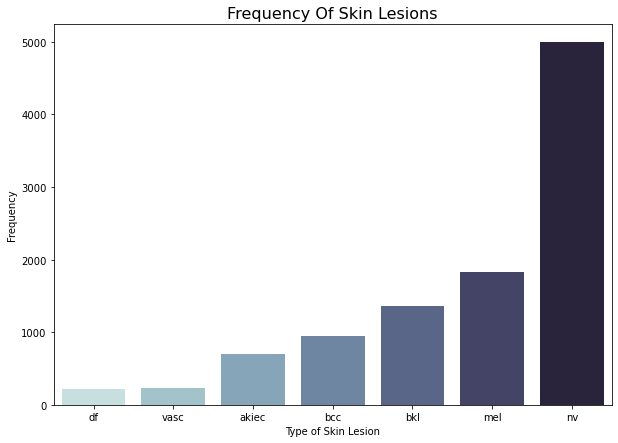

In [25]:
#plot frequency of each class/skin lesion
plt.figure(figsize=(10,7))
col = [x for x in freq_of_lesions.columns]
barplot = sns.barplot(data=freq_of_lesions[col], palette = "ch:start=.2,rot=-.3")
plt.title('Frequency Of Skin Lesions',fontsize=16)
plt.ylabel('Frequency',fontsize=10)
plt.xlabel('Type of Skin Lesion',fontsize=10)   

In [26]:
#check percentage of each class/skin lesion
all_labels['lesion'].value_counts(ascending=False, normalize=True)

nv       0.485792
mel      0.178279
bkl      0.132542
bcc      0.092156
akiec    0.067731
vasc     0.022382
df       0.021117
Name: lesion, dtype: float64

As seen on our barchart above, our dataset has highly imbalanced classes, with NV being the clear majority class over the other 6 classes. This is evident by a high 48.6% of image data present for NV, which is a stark difference from the other 6 classes with less than 20% of image data present per class.
To tackle the problem of imbalanced classes, Synthetic Minority Oversampling Technique (SMOTE) will be used to upsample the minority classes.

#### Diagnosis classification

In [27]:
#Show frequency of each diagnosis class (malignant, benign or precancerous)
freq_binary = pd.DataFrame(all_labels['diagnosis'].value_counts(ascending=True)).T
freq_binary.index = ['frequency']
freq_binary

,precancerous,malignant,benign
frequency,696,2779,6801


Text(0.5, 0, 'Type of Diagnosis')

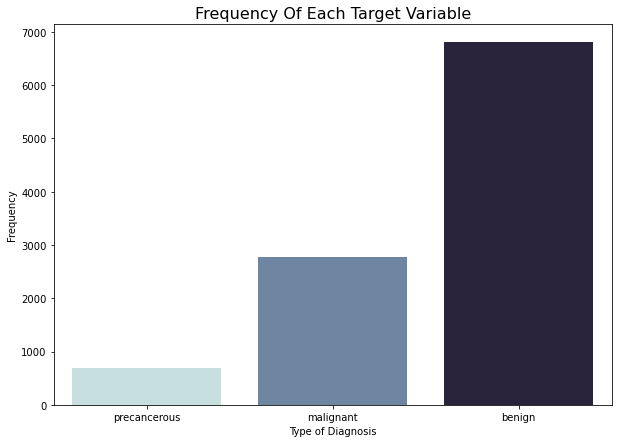

In [28]:
#plot frequency of each diagnosis class (malignant vs benign vs precancerous)
plt.figure(figsize=(10,7))
col = [x for x in freq_binary.columns]
barplot = sns.barplot(data=freq_binary[col], palette = "ch:start=.2,rot=-.3")
plt.title('Frequency Of Each Target Variable',fontsize=16)
plt.ylabel('Frequency',fontsize=10)
plt.xlabel('Type of Diagnosis',fontsize=10)

In [29]:
all_labels['diagnosis'].value_counts(ascending=False, normalize=True)

benign          0.661833
malignant       0.270436
precancerous    0.067731
Name: diagnosis, dtype: float64

Similarly, our dataset also experience highly imbalanced classes for our diagnosis classification, with benign at a high 66.2% as compared to the other two classes (malignant at 27.0% and precancerous at a low 6.8%). 
Similarly, SMOTE will be used to balance the classes.

### Summary Statistics

In [30]:
#majority classes will have higher means
all_labels.describe()

,mel,nv,bcc,akiec,bkl,df,vasc,benign,malignant,precancerous
count,10276.000000,10276.000000,10276.000000,10276.000000,10276.000000,10276.000000,10276.000000,10276.000000,10276.000000,10276.000000
mean,0.178279,0.485792,0.092156,0.067731,0.132542,0.021117,0.022382,0.661833,0.270436,0.067731
std,0.382766,0.499822,0.289261,0.251295,0.339095,0.143782,0.147930,0.473109,0.444207,0.251295
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [31]:
#to check that every column is in the appropriate data type
all_labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10276 entries, 0 to 10275
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   image         10276 non-null  object
 1   mel           10276 non-null  int64 
 2   nv            10276 non-null  int64 
 3   bcc           10276 non-null  int64 
 4   akiec         10276 non-null  int64 
 5   bkl           10276 non-null  int64 
 6   df            10276 non-null  int64 
 7   vasc          10276 non-null  int64 
 8   lesion        10276 non-null  object
 9   diagnosis     10276 non-null  object
 10  benign        10276 non-null  uint8 
 11  malignant     10276 non-null  uint8 
 12  precancerous  10276 non-null  uint8 
dtypes: int64(7), object(3), uint8(3)
memory usage: 833.0+ KB


In [32]:
#export all_labels as labeled_ground_truth
all_labels.to_csv('./datasets/labeled_ground_truth.csv', index=False)

### EDA of Image Sizes

The dimensions of each image can be accessed by img.shape, which returns a tuple of the image's height, width and channels. We will be checking the image sizes of our dataset and appending them to our main dataframe (all_labels)  to analyse the image sizes.

In [34]:
#run this code to get the image sizes of the entire dataset, and to plot violinplot of image sizes

shape_of_image = []
#tqdm to check loading status
for i in tqdm_notebook(range(len(all_labels))):
    #getting the dimensions of each image
    download_image = imageio.imread('./datasets/image_dataset/' + all_labels['image'][i] + '.jpg')
    #create a list of image sizes
    shape_of_image.append(download_image.shape)

In [35]:
#make image sizes data into dataframe
shape_image = pd.DataFrame(shape_of_image, columns = ['height', 'width', 'channel'])

In [36]:
#create new column showing dimensions in the form of (height, width)
shape_image['height_and_width'] = '(' + shape_image['height'].astype(str) + ', ' + shape_image['width'].astype(str) + ')'
shape_image.head()

,height,width,channel,height_and_width
0,222,294,3,"(222, 294)"
1,222,294,3,"(222, 294)"
2,222,294,3,"(222, 294)"
3,222,294,3,"(222, 294)"
4,222,294,3,"(222, 294)"


In [37]:
#add image size columns into all_labels
all_labels = pd.concat([all_labels, shape_image], axis=1)
all_labels.head()

,image,mel,nv,bcc,akiec,bkl,df,vasc,lesion,diagnosis,benign,malignant,precancerous,height,width,channel,height_and_width
0,DERM_001,0,0,0,0,0,1,0,df,benign,1,0,0,222,294,3,"(222, 294)"
1,DERM_002,0,0,0,0,0,1,0,df,benign,1,0,0,222,294,3,"(222, 294)"
2,DERM_003,0,0,0,0,0,1,0,df,benign,1,0,0,222,294,3,"(222, 294)"
3,DERM_004,0,0,0,0,0,1,0,df,benign,1,0,0,222,294,3,"(222, 294)"
4,DERM_005,0,0,0,0,0,1,0,df,benign,1,0,0,222,294,3,"(222, 294)"


In [38]:
#export newly updated all_labels as labeled_with_size.csv
all_labels.to_csv('./datasets/labeled_with_size.csv', index=False)

In [39]:
#Show frequency of image sizes/dimensions
freq_dimensions = pd.DataFrame(all_labels['height_and_width'].value_counts(ascending=True)).T
freq_dimensions.index = ['frequency']
freq_dimensions

,"(1983, 1983)","(1775, 1775)","(4288, 2848)","(3024, 4032)","(2592, 3888)","(2317, 2317)","(511, 768)","(3456, 5184)","(2848, 4288)","(222, 294)","(4000, 6000)","(1936, 2592)","(2448, 3264)","(512, 768)","(1024, 1024)","(450, 600)"
frequency,1,1,1,1,1,2,3,6,13,20,20,32,41,61,1770,8303


In [40]:
#print percentage of each image size
print('image sizes:')
all_labels['height_and_width'].value_counts(ascending=False, normalize=True)

image sizes:


(450, 600)      0.807999
(1024, 1024)    0.172246
(512, 768)      0.005936
(2448, 3264)    0.003990
(1936, 2592)    0.003114
(4000, 6000)    0.001946
(222, 294)      0.001946
(2848, 4288)    0.001265
(3456, 5184)    0.000584
(511, 768)      0.000292
(2317, 2317)    0.000195
(2592, 3888)    0.000097
(3024, 4032)    0.000097
(4288, 2848)    0.000097
(1775, 1775)    0.000097
(1983, 1983)    0.000097
Name: height_and_width, dtype: float64

Text(0.5, 0, 'Dimension')

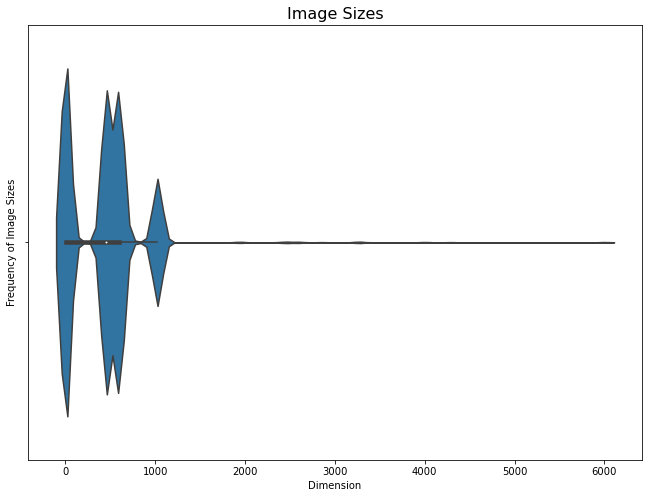

In [55]:
#plot frequency of image sizes
plt.figure(figsize=(11,8))
col = [x for x in freq_dimensions.columns]
sns.violinplot(shape_of_image)
plt.title('Image Sizes',fontsize=16)
plt.ylabel('Frequency of Image Sizes',fontsize=10)
plt.xlabel('Dimension',fontsize=10)

In [42]:
#checking for total number of image sizes for our dataset
len(freq_dimensions.columns)

16

As seen above, there are varying image sizes for our image dataset (16 different image sizes), with 80.8% of our dataset having image dimensions of 450x600, and the other images with dimensions ranging from 222 to 6000 pixels. 
Hence, there is a need to make the image sizes uniform across our entire dataset by resizing them during the image preprocessing stage.
Since most of the images lacks a 1:1 aspect ratio, we will also be adding padding to those images to convert them to 1:1 aspect ratio.

### Analysing Images for Preprocessing Ideas

To get an idea of what other image preprocessing methods (besides resizing and padding) are needed for our dataset, a subset of our image dataset for each class will be shown.

In [43]:
#image_dataset download link: https://bit.ly/image_dataset

#directory for dataset
image_dir = os.getcwd() + "/datasets/image_dataset/"

#read in csv for labeled_ground_truth as data_labels
data_labels = pd.read_csv('./datasets/labeled_ground_truth.csv')

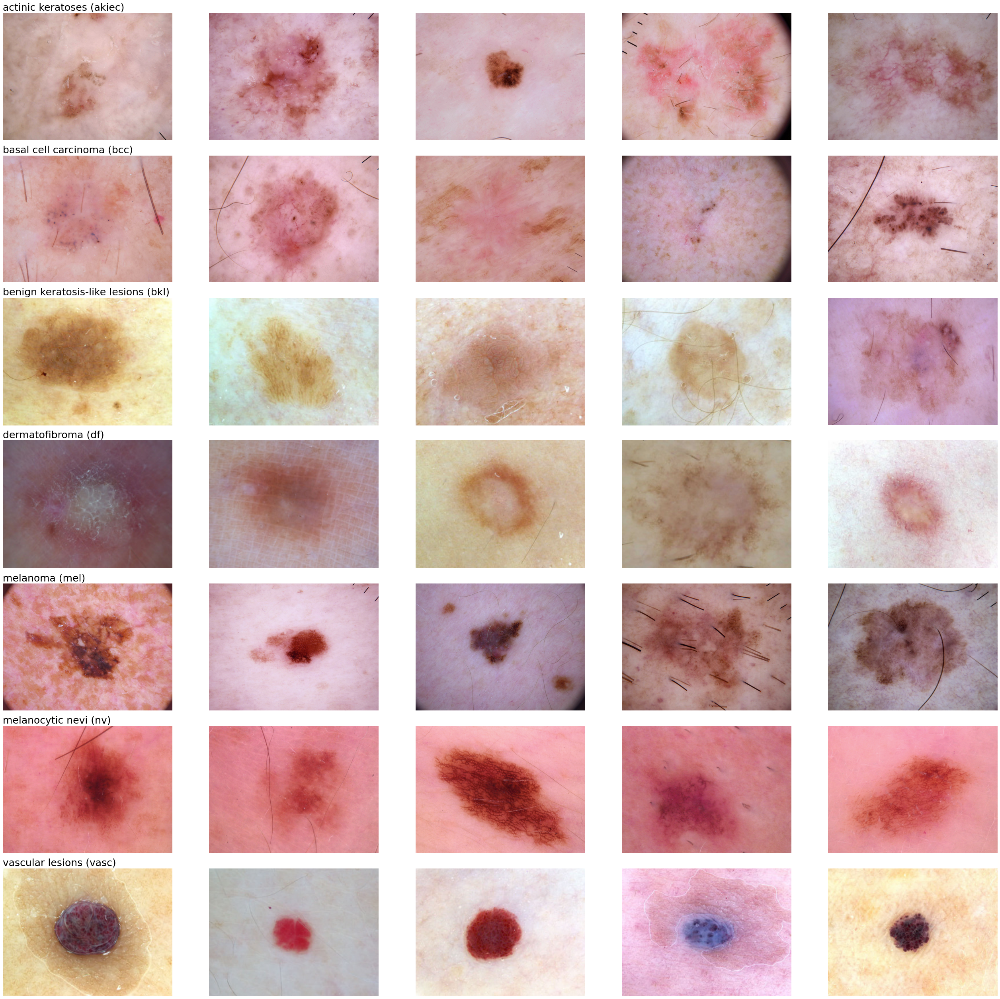

In [44]:
#Visualizing the images for skin lesion classification 
#to determine what kind of processing needs to be done

#labels
label_multi = [ 'akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
label_images_multi = []
classes_multi = [ 'actinic keratoses (akiec)', 'basal cell carcinoma (bcc)', 'benign keratosis-like lesions (bkl)', 
           'dermatofibroma (df)', 'melanoma (mel)', 'melanocytic nevi (nv)', 'vascular lesions (vasc)']

fig = plt.figure(figsize=(35, 35))

for i in label_multi:
    sample_multi = data_labels[data_labels['lesion'] == i]['image'][:5]
    label_images_multi.extend(sample_multi)
    
for position, ID in enumerate(label_images_multi):
    im_sample_multi = image_dir + f'{ID}.jpg'
    im_sample_multi = imageio.imread(im_sample_multi)

    plt.subplot(7,5,position+1)
    plt.imshow(im_sample_multi)
    plt.axis('off')

    if position%5 == 0:
        title = int(position/5)
        plt.title(classes_multi[title], loc='left', size=25)

plt.tight_layout()
plt.show()

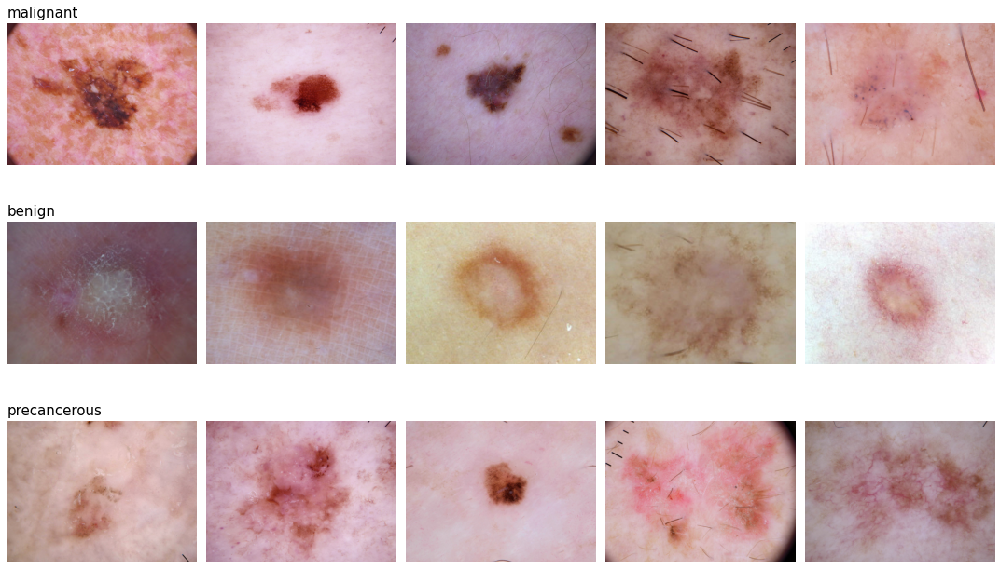

In [45]:
#Visualizing the images for malignant classification
#to determine what kind of processing needs to be done

#labels
label_malignant = ['malignant', 'benign', 'precancerous']
label_images_malignant = []
classes_malignant = [ 'malignant', 'benign', 'precancerous']

fig = plt.figure(figsize=(15, 15))

for i in label_malignant:
    sample_malignant = data_labels[data_labels['diagnosis'] == i]['image'][:5]
    label_images_malignant.extend(sample_malignant)
    
for position, ID in enumerate(label_images_malignant):
    im_sample_malignant = image_dir + f'{ID}.jpg'
    im_sample_malignant = imageio.imread(im_sample_malignant)

    plt.subplot(5,5,position+1)
    plt.imshow(im_sample_malignant)
    plt.axis('off')

    if position%5 == 0:
        title = int(position/5)
        plt.title(classes_malignant[title], loc='left', size=15)

plt.tight_layout()
plt.show()

Looking at the images above, it is apparent that a substantial amount of hair and black markings are present in several photos which will need to be removed during the image preprocessing stage.
The images also have varying colours, brightness and contrast and hence colour normalisation will need to be done through colour constancy techniques (grey-world algorithm will be used in our project).
Several images also contain extra black round borders/padding and hence, minimal usage of central crop could be utilised to remove some of these black borders.

### Preprocessing Ideas

Here are some of the image preprocessing ideas that are suggested from our EDA. We will be executing them in our 2_Image_Preprocessing notebook.

In [46]:
image_ids = all_labels['image']

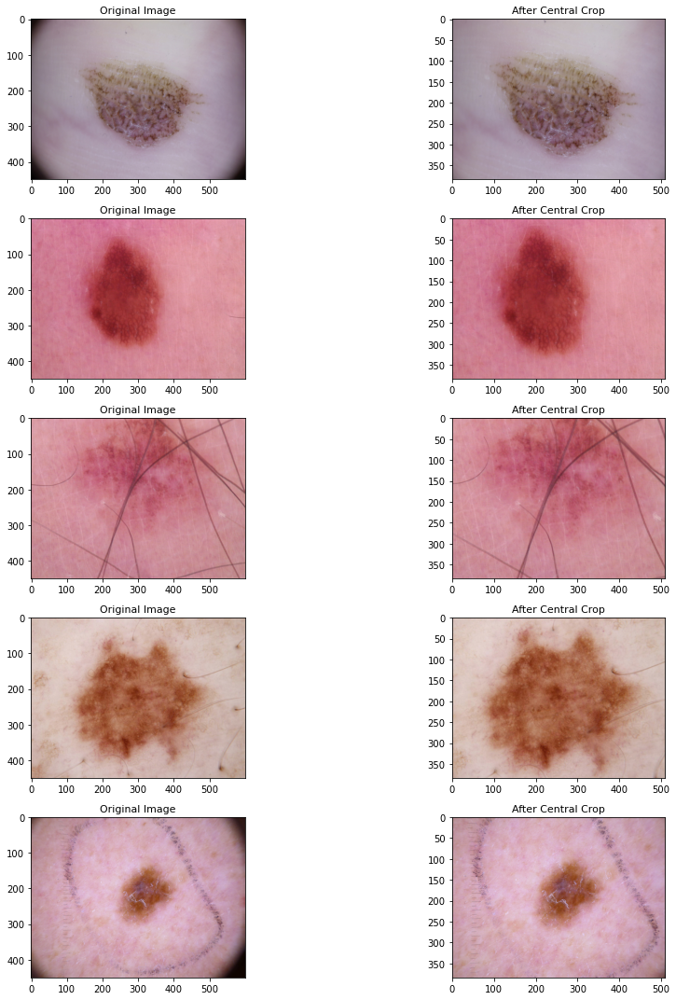

In [47]:
#how it looks like if central_crop is used
#extra round black borders/padding mostly removed; lesions are enlarged too
plt.figure(figsize = (15,15))
count = 1
for img_id in image_ids[55:60]:
    img = imageio.imread(image_dir + img_id + '.jpg')
    plt.subplot(5,2, count)
    plt.imshow(img)
    plt.title('Original Image', fontsize=11)
    
    #use central_crop with 85% from center
    cropped_img = tf.image.central_crop(img, 0.85)
    plt.subplot(5,2,count+1)
    plt.imshow(cropped_img)
    plt.title('After Central Crop', fontsize=11)
    
    #to plot next photo
    count = count + 2
plt.tight_layout()


In [48]:
#grey world colour correction/colour normalisation
#credit: https://gist.github.com/shunsukeaihara/4603234
def grey_world(img):
    img = img.transpose(2, 0, 1).astype(np.uint32)
    mu_g = np.average(img[1])
    img[0] = np.minimum(img[0]*(mu_g/np.average(img[0])),255)
    img[2] = np.minimum(img[2]*(mu_g/np.average(img[2])),255)
    return img.transpose(1, 2, 0).astype(np.uint8)

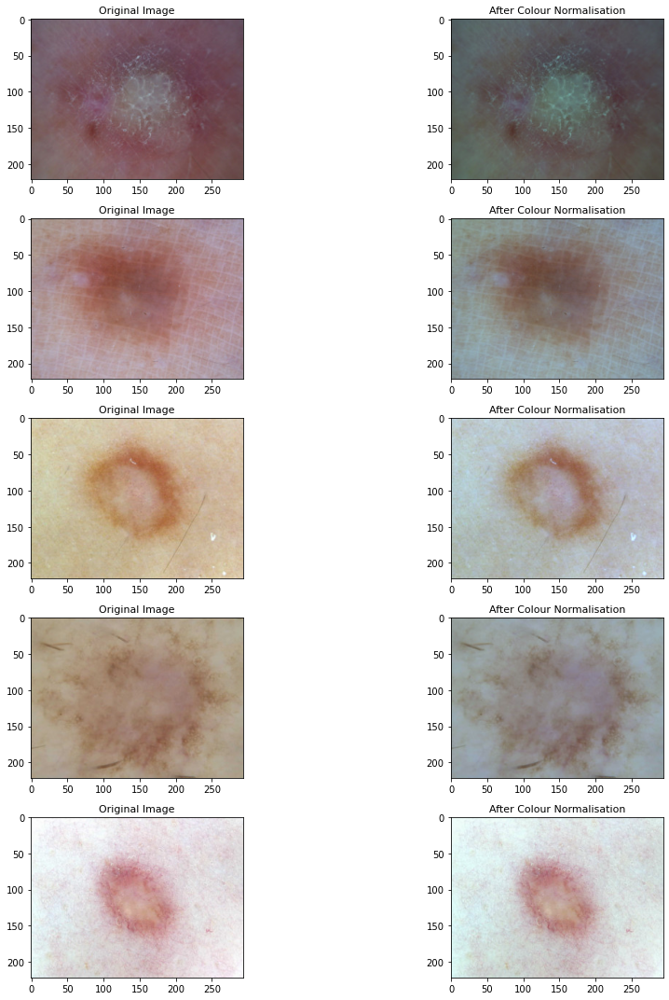

In [49]:
#how it looks when grey world colour correction is done
plt.figure(figsize = (15,15))
count = 1
for img_id in image_ids[:5]:
    img = imageio.imread(image_dir + img_id + '.jpg')
    plt.subplot(5,2, count)
    plt.imshow(img)
    plt.title('Original Image', fontsize=11)
    
    #execute grey world colour correction/colour normalisation
    normalised_img = grey_world(img)
    plt.subplot(5,2,count+1)
    plt.imshow(normalised_img)
    plt.title('After Colour Normalisation', fontsize=11)
    
    #to plot next photo
    count = count + 2
plt.tight_layout()

In [50]:
#black hair and markings removal
#code credited from https://github.com/sunnyshah2894/DigitalHairRemoval/blob/master/DigitalHairRemoval.py
def remove_hair(img):
    #Convert the original image to grayscale
    grayscale = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    #structural element for the morphological filtering
    structural_element = cv2.getStructuringElement(1,(20,20))

    #Perform the black top-hat filtering on the grayscale image to find the hair contours
    blackhat = cv2.morphologyEx(grayscale, cv2.MORPH_BLACKHAT, structural_element)

    #intensify the hair contours in preparation for the inpainting algorithm
    ret,thresh2 = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY)

    #inpaint (image interpolation) the original image depending on the mask
    image = cv2.inpaint(img,thresh2,3,cv2.INPAINT_TELEA)

    return image

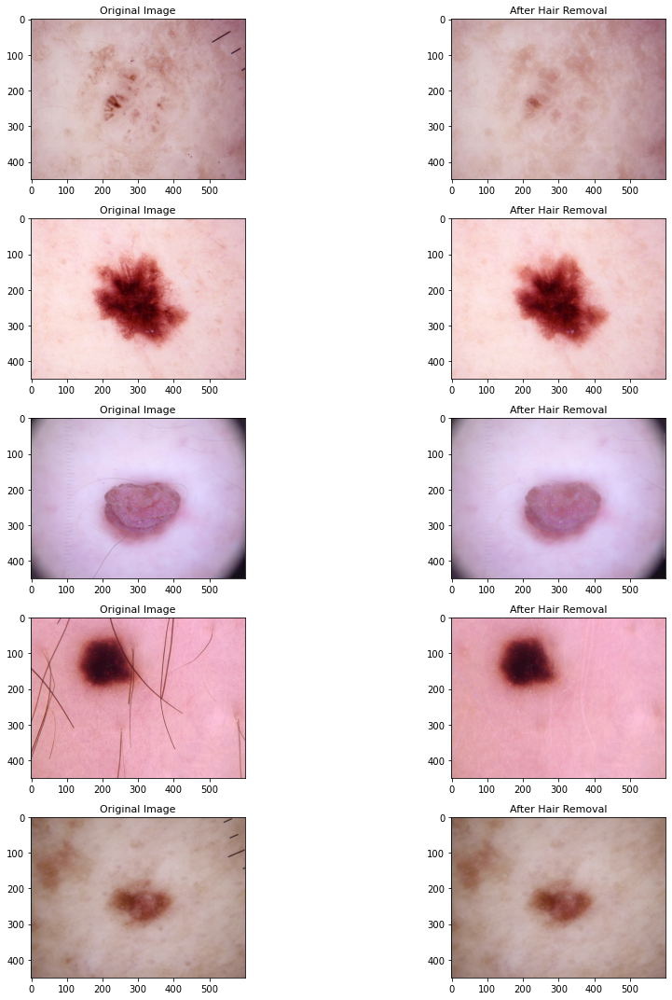

In [51]:
#how it looks when hair removal is done
plt.figure(figsize = (15,15))
count = 1
for img_id in image_ids[310:315]:
    img = imageio.imread(image_dir + img_id + '.jpg')
    plt.subplot(5,2, count)
    plt.imshow(img)
    plt.title('Original Image', fontsize=11)
    
    #execute hair removal
    removed_img = remove_hair(img)
    plt.subplot(5,2,count+1)
    plt.imshow(removed_img)
    plt.title('After Hair Removal', fontsize=11)
    
    #to plot next photo
    count = count + 2
plt.tight_layout()

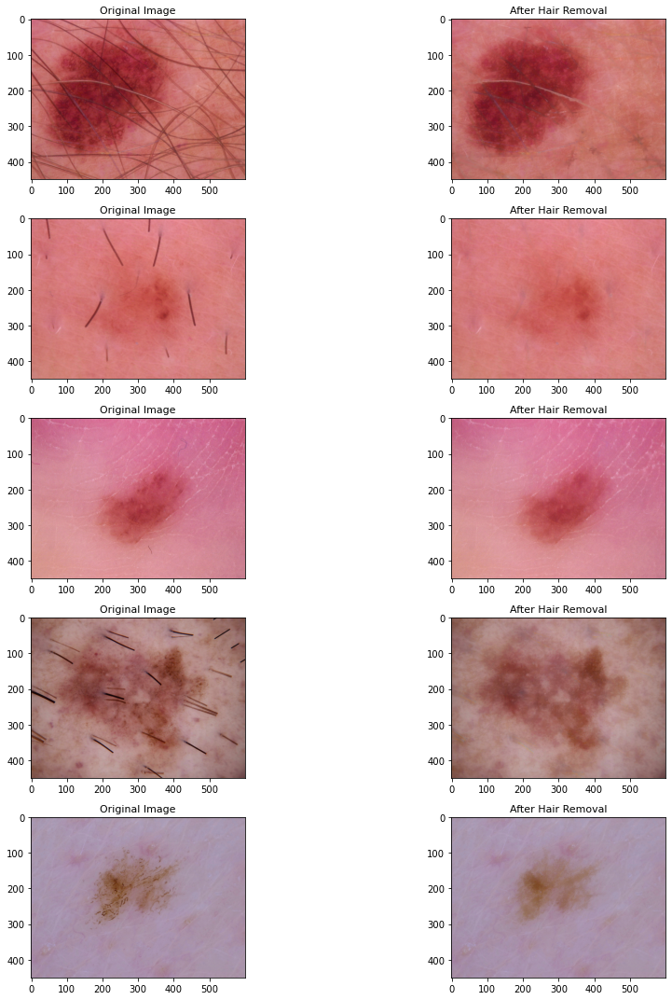

In [52]:
#how it looks when hair removal is done
plt.figure(figsize = (15,15))
count = 1
for img_id in image_ids[35:40]:
    img = imageio.imread(image_dir + img_id + '.jpg')
    plt.subplot(5,2, count)
    plt.imshow(img)
    plt.title('Original Image', fontsize=11)
    
    #execute hair removal
    removed_img = remove_hair(img)
    plt.subplot(5,2,count+1)
    plt.imshow(removed_img)
    plt.title('After Hair Removal', fontsize=11)
    
    #to plot next photo
    count = count + 2
plt.tight_layout()

In [53]:
#create padding function for images without 1:1 aspect ratio
def padding(img):
    if img.shape[0] != img.shape[1]:
        padding = round(abs(img.shape[0] - img.shape[1])/2)
        #add padding to maintain aspect ratio for images without 1:1 aspect ratio
        if img.shape[0] < img.shape[1]:
            img = cv2.copyMakeBorder(img, padding, padding, 0, 0, cv2.BORDER_CONSTANT, value=(0,0,0))
        elif img.shape[1] < img.shape[0]:
            img = cv2.copyMakeBorder(img, 0, 0, padding, padding, cv2.BORDER_CONSTANT, value=(0,0,0))
        #crop central to remove some of the padding that was either created or already present in the image
        img = tf.image.central_crop(img, 0.85) 
        
    else:
        #crop central to the other images
        #to remove some of the padding/borders that were present in the original images
        img = tf.image.central_crop(img, 0.85)
        
    return img 

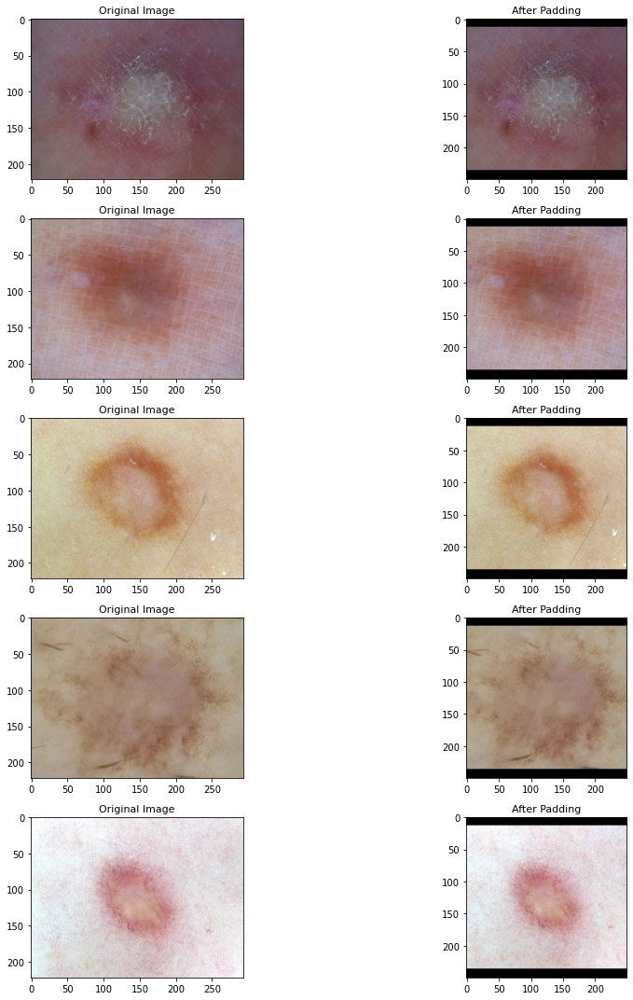

In [54]:
#how it looks when padding is given
plt.figure(figsize = (15,15))
count = 1
for img_id in image_ids[:5]:
    img = imageio.imread(image_dir + img_id + '.jpg')
    plt.subplot(5,2, count)
    plt.imshow(img)
    plt.title('Original Image', fontsize=11)
    
    #execute padding to change aspect ratio
    padded_img = padding(img)
    plt.subplot(5,2,count+1)
    plt.imshow(padded_img)
    plt.title('After Padding', fontsize=11)
    
    #to plot next photo
    count = count + 2
plt.tight_layout()